# Week IV: Generative AI and Large Language Models (LLMs)

Today we'll learn about LLMs, and how to setup your own local GPT using HuggingFace.

We'll focus on an open-source model called Mistral.

Let's start with some installations:

In [1]:
!pip install -U langchain sentence_transformers faiss-cpu accelerate peft bitsandbytes trl gradio

In [2]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

## Basic Text Generation

Let's look at [Mistral's documentation](https://huggingface.co/mistralai/Mistral-7B-Instruct-v0.2) and use their example.

First, check memory:

In [3]:
!nvidia-smi

Sun Mar 10 18:04:30 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

Now, let's load the model and its tokenizer:

In [4]:
from transformers import AutoModelForCausalLM, AutoTokenizer
import torch

device = "cuda" # the device to load the model onto

# Load the model from Hugging Face Hub
model = AutoModelForCausalLM.from_pretrained("mistralai/Mistral-7B-Instruct-v0.2",
                                             device_map=device,
                                             torch_dtype=torch.bfloat16) # -> Make sure to use float16 to save memory

# Load its tokenizer
tokenizer = AutoTokenizer.from_pretrained("mistralai/Mistral-7B-Instruct-v0.2")

# With Mistral, we need to set the padding token to the end of the sequence
tokenizer.pad_token = tokenizer.eos_token
tokenizer.padding_side = "right"

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Check memory again:

In [5]:
!nvidia-smi

Sun Mar 10 18:05:49 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   49C    P0              28W /  70W |  14685MiB / 15360MiB |     15%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

Take a question, and convert it to the relevant format:

In [6]:
messages = [
    {"role": "user", "content": "What is the capital of France?"},
]
encoded = tokenizer.apply_chat_template(messages, return_tensors="pt")
print(encoded)

tensor([[    1,   733, 16289, 28793,  1824,   349,   272,  5565,   302,  4843,
         28804,   733, 28748, 16289, 28793]])


In [7]:
tokenizer.decode(encoded[0])

'<s> [INST] What is the capital of France? [/INST]'

In [8]:
from pprint import pprint
model_inputs = encoded.to(device)

generated_ids = model.generate(model_inputs,
                               pad_token_id=tokenizer.eos_token_id)
decoded = tokenizer.batch_decode(generated_ids)
pprint(decoded[0])

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1178: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


'<s> [INST] What is the capital of France? [/INST] The capital city of France'


Too short, let's request more tokens:

In [9]:
generated_ids = model.generate(model_inputs,
                               pad_token_id=tokenizer.eos_token_id,
                               max_length=1000)
decoded = tokenizer.batch_decode(generated_ids)
pprint(decoded[0])

('<s> [INST] What is the capital of France? [/INST] The capital city of France '
 'is Paris. Paris is one of the most famous cities in the world and is known '
 'for its iconic landmarks such as the Eiffel Tower, Louvre Museum, Notre-Dame '
 'Cathedral, and the Arc de Triomphe. It is also home to numerous cultural and '
 'artistic masterpieces, and is a major global center for art, fashion, '
 'gastronomy, and culture.</s>')


We can also play with other parameters:

In [10]:
generated_ids = model.generate(model_inputs,
                               pad_token_id=tokenizer.eos_token_id,
                               do_sample=True,
                               max_length=1000,
                               temperature=0.7,
                               top_k=50,
                               top_p=0.95)
decoded = tokenizer.batch_decode(generated_ids)
pprint(decoded[0])

('<s> [INST] What is the capital of France? [/INST] The capital city of France '
 'is Paris. Paris is one of the most famous cities in the world and is known '
 'for its iconic landmarks such as the Eiffel Tower, the Louvre Museum, and '
 'Notre-Dame Cathedral. It is also the most populous city in France, with over '
 '12 million people living in the metropolitan area. Paris has been the '
 'capital city of France since the late 15th century.</s>')


In [11]:
question = """\
You are given a question below.
You must answer in a concise manner.
What is the capital of France?
"""
messages = [
    {"role": "user", "content": question},
]

encoded = tokenizer.apply_chat_template(messages, return_tensors="pt")
model_inputs = encoded.to(device)

generated_ids = model.generate(model_inputs,
                               pad_token_id=tokenizer.eos_token_id,
                               do_sample=True,
                               max_length=1000,
                               temperature=0.7,
                               top_k=50,
                               top_p=0.95)
decoded = tokenizer.batch_decode(generated_ids)
pprint(decoded[0])

('<s> [INST] You are given a question below. \n'
 'You must answer in a concise manner. \n'
 'What is the capital of France?\n'
 ' [/INST] The capital city of France is Paris.</s>')


## Few-shot learning

Prompts have a very strong impact on the performance of the LLM. It's important to write a clear, detailed prompt. One strategy is to use few-shot learning.

  When asking the model to solve a task, we can give it examples. The model will learn from the examples and usually perform better.

In [12]:
def generate_answer(question):
  messages = [
    {"role": "user", "content": question},
  ]

  encoded = tokenizer.apply_chat_template(messages, return_tensors="pt")
  model_inputs = encoded.to(device)

  generated_ids = model.generate(model_inputs,
                                pad_token_id=tokenizer.eos_token_id,
                                do_sample=True,
                                max_length=1000,
                                temperature=0.7,
                                top_k=50,
                                top_p=0.95)
  decoded = tokenizer.batch_decode(generated_ids)
  return decoded[0]

In [13]:
question = """\
For a given NBA player (below), give me a list of the following stats in order: PPG, RPG, APG.
Return it as a JSON with his name as one of the keys.

NBA player:
Michael Jordan
"""
answer = generate_answer(question)
print(answer)

<s> [INST] For a given NBA player (below), give me a list of the following stats in order: PPG, RPG, APG.
Return it as a JSON with his name as one of the keys.

NBA player:
Michael Jordan
 [/INST] {
  "name": "Michael Jordan",
  "stats": [
    "29.2", // Average points per game (PPG) for Michael Jordan's career
    "6.0", // Average rebounds per game (RPG) for Michael Jordan's career
    "5.3" // Average assists per game (APG) for Michael Jordan's career
  ]
}</s>


In [14]:
question = """\
For a given NBA player (below), give me a list of the following stats in order: PPG, RPG, APG.
Return it as a JSON with his name as one of the keys.

EXAMPLE:
{
  "player_name": "Steph Curry",
  "points": 24.8,
  "rebounds": 4.7,
  "assists": 6.4
}

NBA player:
Michael Jordan
"""
answer = generate_answer(question)
print(answer)

<s> [INST] For a given NBA player (below), give me a list of the following stats in order: PPG, RPG, APG.
Return it as a JSON with his name as one of the keys.

EXAMPLE:
{
  "player_name": "Steph Curry",
  "points": 24.8,
  "rebounds": 4.7,
  "assists": 6.4
}

NBA player:
Michael Jordan
 [/INST] {
  "player_name": "Michael Jordan",
  "points": 30.1,
  "rebounds": 6.2,
  "assists": 5.3
}

Please note that the statistics provided (30.1 PPG, 6.2 RPG, 5.3 APG) are averages from Michael Jordan's career in the NBA.</s>


We can see that the formatting is much better here!

In [15]:
!nvidia-smi

Sun Mar 10 18:06:22 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P0              40W /  70W |  14813MiB / 15360MiB |     44%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

Remove model from GPU to save memory:

In [16]:
import gc
del model
gc.collect()
torch.cuda.empty_cache()

Notice the drop:

In [17]:
!nvidia-smi

Sun Mar 10 18:06:23 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   64C    P0              39W /  70W |    151MiB / 15360MiB |     48%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Use Gradio to create a basic app

Now, we'll use a package called [Gradio](https://www.gradio.app/) to easily create a usable app. Another option is [Streamlit](https://streamlit.io/).



Let's load the model as before:

In [19]:
import torch
from transformers import AutoModelForCausalLM, AutoTokenizer, StoppingCriteria, StoppingCriteriaList, TextIteratorStreamer

tokenizer = AutoTokenizer.from_pretrained('mistralai/Mistral-7B-Instruct-v0.2')
tokenizer.pad_token = tokenizer.eos_token
tokenizer.padding_side = "right"

model = AutoModelForCausalLM.from_pretrained('mistralai/Mistral-7B-Instruct-v0.2', torch_dtype=torch.bfloat16, device_map='cuda')

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

In [20]:
import gradio as gr
from threading import Thread
from transformers import AutoModelForCausalLM, AutoTokenizer, TextIteratorStreamer

def predict(message, history):
    history_transformer_format = history + [[message, ""]]

    messages = "".join(["".join(["\n<human>:"+item[0], "\n<bot>:"+item[1]]) for item in history_transformer_format])

    model_inputs = tokenizer([messages], return_tensors="pt").to("cuda")
    streamer = TextIteratorStreamer(tokenizer, timeout=10., skip_prompt=True, skip_special_tokens=True)
    generate_kwargs = dict(
        model_inputs,
        streamer=streamer,
        max_new_tokens=1024,
        do_sample=True,
        top_p=0.95,
        top_k=50,
        temperature=0.2,
        num_beams=1,
        )
    t = Thread(target=model.generate, kwargs=generate_kwargs)
    t.start()

    partial_message = ""
    for new_token in streamer:
        if new_token != '<':
            partial_message += new_token
            yield partial_message

ui = gr.ChatInterface(predict)
ui.launch()

Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://d7cd3ec2138752c691.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


## Retrieval Augmented Generation (RAG)

How to add new information to a pre-trained model?

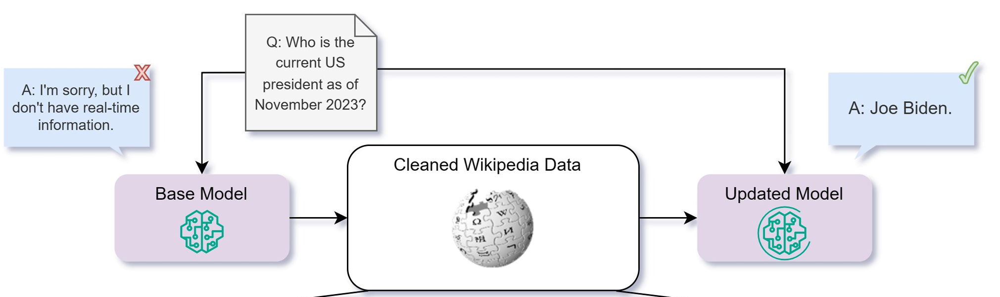

How does it work?

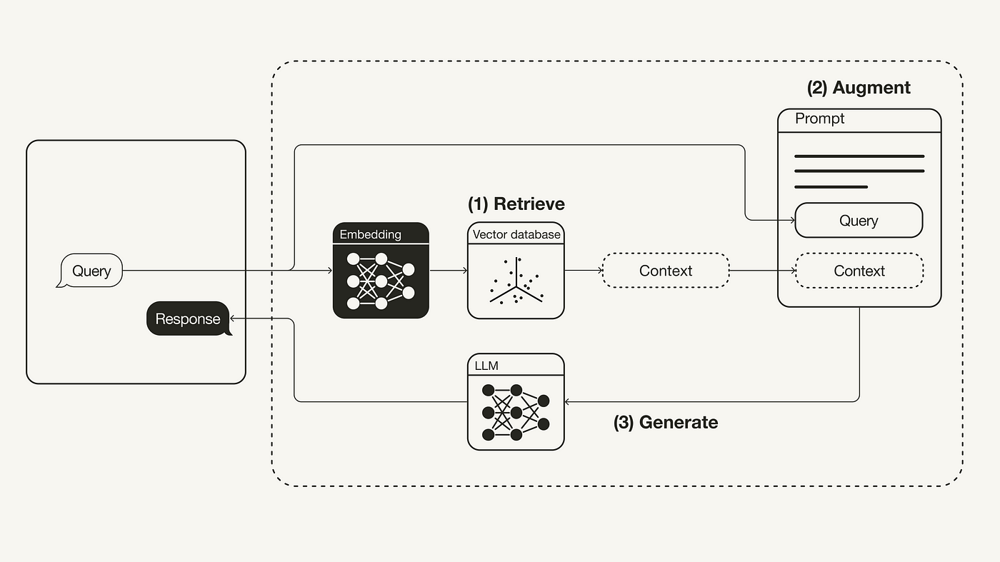

[Image source](https://towardsdatascience.com/retrieval-augmented-generation-rag-from-theory-to-langchain-implementation-4e9bd5f6a4f2), [RAG source](https://medium.com/@thakermadhav/build-your-own-rag-with-mistral-7b-and-langchain-97d0c92fa146).

### Dependencies

In [1]:
import os
import torch
from transformers import (
    AutoModelForCausalLM,
    AutoTokenizer,
    BitsAndBytesConfig,
    pipeline
)
from datasets import load_dataset
from peft import LoraConfig, PeftModel

from langchain.text_splitter import CharacterTextSplitter
from langchain.embeddings.huggingface import HuggingFaceEmbeddings
from langchain.vectorstores import FAISS

from langchain.prompts import PromptTemplate
from langchain.schema.runnable import RunnablePassthrough
from langchain.llms import HuggingFacePipeline
from langchain.chains import LLMChain

from pprint import pprint

### Load quantized Mistal 7B

LLMs demand a lot of memory. One recent advancement is the concept of quantization. Instead of loading models at full precision, we can load the weights in lower precision and use much less memory.

In [2]:
model_name = 'mistralai/Mistral-7B-Instruct-v0.2'

model = AutoModelForCausalLM.from_pretrained(
    model_name,
    torch_dtype=torch.bfloat16,
    load_in_4bit=True
)

tokenizer = AutoTokenizer.from_pretrained(model_name)
tokenizer.pad_token = tokenizer.eos_token
tokenizer.padding_side = "right"

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
The `load_in_4bit` and `load_in_8bit` arguments are deprecated and will be removed in the future versions. Please, pass a `BitsAndBytesConfig` object in `quantization_config` argument instead.
`low_cpu_mem_usage` was None, now set to True since model is quantized.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

In [3]:
!nvidia-smi

Sun Mar 10 18:11:33 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   63C    P0              30W /  70W |   5053MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

messages = [
    {"role": "user", "content": "What is the all-time high of Bitcoin in USD?"},
]

encodeds = tokenizer.apply_chat_template(messages, return_tensors="pt")

model_inputs = encodeds.to(device)

generated_ids = model.generate(model_inputs, max_new_tokens=1000,
                               do_sample=True, temperature=0.1, top_k=50, top_p=0.95)
decoded = tokenizer.batch_decode(generated_ids)
pprint(decoded[0])

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:2 for open-end generation.


('<s> [INST] What is the all-time high of Bitcoin in USD? [/INST] The all-time '
 'high of Bitcoin in US Dollars was reached on March 13, 2022, when the price '
 'of one Bitcoin reached an intraday peak of approximately $64,863.10. This '
 'value represents a new record high for Bitcoin, surpassing its previous '
 'all-time high of around $20,000, which was reached in December 2020. It is '
 'important to note that the price of Bitcoin is highly volatile and can '
 'fluctuate significantly in short periods of time.</s>')


### Build Mistral text generation pipeline

In [5]:
text_generation_pipeline = pipeline(
    model=model,
    tokenizer=tokenizer,
    task="text-generation",
    temperature=0.2,
    top_p=0.95,
    top_k=50,
    repetition_penalty=1.1,
    return_full_text=True,
    max_new_tokens=1000,
    pad_token_id=tokenizer.eos_token_id,
    do_sample=True
)

In [6]:
mistral_llm = HuggingFacePipeline(pipeline=text_generation_pipeline)

### Load and chunk documents. Load chunked documents into FAISS index

In [7]:
docs = """
05:34 PM GMT
Taiwanese giant to win over $5bn in US chip subsidies
TSMC, the Taiwan Semiconductor Manufacturing Company, is to win more than $5bn in grants for a US chip plant, Bloomberg has reported.

The company, along with other major chipmarkers, have been in talks to secure money from a pot of about $28bn of subsidies as President Biden seeks to boost American semiconductor manufacturing.

----------
05:29 PM GMT
US shares drop as investors cash in chip stocks
The Nasdaq Composite index and the S&P 500 have fallen as a rally in chip stocks lost some steam, while a mixed jobs market report showed that employers added more jobs than expected in February though the unemployment rate unexpectedly rose.

The two indexes briefly hit record highs earlier in trading before gains were wiped out.

AI darling Nvidia fell 4.4pc after hitting a fresh record high, while the Philadelphia Semiconductor Index, made up of 30 leading semiconductor companies, also came off a record peak, down 2.4pc today.

Dennis Dick, a trader at Triple D Trading, said:

We’re just at a point where investors maybe have chased these stocks too much and they need to cool off a bit.

What you’re seeing is profit-taking. People may be nervous going into the weekend.

----------
05:20 PM GMT
Lack of detail on packaging megamerger won’t catch on, says Hargreaves Lansdown
A merger between Mondi and DS Smith that will create a FTSE 100 packaging giant lacks clarity on the numbers which is bizzare, a leading investment firm has said.

Steve Clayton, head of equity funds at Hargreaves Lansdown, said:

The groups say they can see substantial synergies from combining operations, but bizarrely at such a late stage in a deal’s progression, they have not yet quantified these synergies.

That will come later, and in the meantime investors in both companies are left to figure out if they are going to be sufficient to merit DS Smith investors giving up control of the group and Mondi investors roughly halving their exposure to the assets they currently own.

This does not look like a deal-making trend that is likely to catch on.

----------
04:35 PM GMT
iPhone supplier drops 5.4pc after missing target
Shares in a US technology firm which supplies wireless components for the iPhone have dropped today after it revenues disappointed.

Bloomberg reported that Broadcom’s semiconductor division delivered quarterly revenue of $7.39bn (£5.75bn), missing the $7.7bn analysts expected. However, in line with a previous forecast, the chipmaker remains on track for $50bn in sales during its current financial year, which ends in October.

Last year, Broadcom entered a new multibillion-dollar deal with Apple to produce 5G radio frequency components for Apple. The company also supplies technology that is widely used in home broadband routers.

----------
03:54 PM GMT
Bitcoin hits $70,000 as market bets on interest rate cuts
Bitcoin has reached an all-time high, breaching $70,000 this afternoon, as investors become more confident of interest rate cuts by the US Federal Reserve.

The cryptocurrency has risen 215pc over the past year, in part because investors expected the US authorities to extend its appeal by making it easier for retail investors to buy the currency.

In January, the Securities and Exchange Commission (SEC) authorised the trading of a number of Bitcoin exchange traded funds. This meant popular fund providers in the US, including BlackRock and Fidelity, could sell Bitcoin-related funds.

However, despite the move, the SEC’s chairman Gary Gensler issued a warning, saying: “Bitcoin is primarily a speculative, volatile asset that’s also used for illicit activity including ransomware, money laundering, sanction evasion, and terrorist financing.”

Lower interest rates make assets such as cryptocurrency, which do not pay interest or dividends, more attractive. Investors rely solely on future buyers valuing them more highly in order to get a return.


----------
03:44 PM GMT
US economy ‘doing what the Fed needs’
Investors fuelled record-breaking stock rallies on Friday and pushed yields on US Treasury bonds to their lowest in a month after US jobs data supported the idea that the Fed will begin cutting by the middle of the year.

Lindsey Bell, chief strategist with 248 Ventures, said:

It really kind of solidifies what chair [Jerome] Powell was saying this week, about the confidence he had in the potential to begin the rate cutting cycle this year. So the market should be pleased with this report.

The economy’s doing fine. Its slowing in an orderly manner, not too quickly. Its doing what the Fed needs.


Argentina’s runaway inflation slows anid libertarian President
Argentina’s monthly inflation rate likely slowed to 15.3pc in February, still painfully high but down sharply from a peak in December, as new libertarian President Javier Milei’s tries to get a grip on runaway prices.

The forecast, the average from a Reuters poll of 13 analysts, would mark a slower pace of price rises from over 20pc in January and 25pc the month before when Mr Milei took office and sharply devalued the peso currency.

Mr Milei’s government, battling the highest inflation rate of any major economy worldwide with annual price rises running at over 250pc, is trying to stem the flood with a major cost-cutting drive and tight monetary policy to mop up pesos.

That has helped strengthen the currency, put the brakes on prices and buoyed markets that are keen on Mr Milei’s pledge to overturn a deep fiscal deficit. But it has come at the cost of growth, with stalling consumption and production.


----------
Nvidia share price crashed over 5.50 percent on Friday and erased around $128 billion of investors. The Nasdaq-listed AI poster boy of 2024 registered sharp selling during the Friday session on Wall Street and ended at $875.28 per share, logging around 10 percent dip from its lifetime high of $974 per share level. Nvidia stock price opened at $951.38 per share level and went on to touch a new high of $974 apiece on Nasdaq during Friday deals. However, Nvidia stock failed to sustain at higher levels after the profit-booking trigger, which further deepened following the selling pressure in the S&P 500 and Nasdaq indices.

According to stock market experts, Nvidia stock price crashed after climbing to a new peak on Friday because of the selling pressure in the S&P 500 index and tech-heavy Nasdaq index. They said that selling pressure in these Wall Street indices was caused by disappointing US job data that dampened the US fed rate cut buzz. Apart from this, dips in sales and weak quarterly numbers of the US auto majors — Tesla,  Broadcom, and Costco — was another reason for the Nvidia stock price fall on Friday.

Reasons for Nvidia stock price fall
Speaking on the reasons that triggered selling pressure in Nvidia stocks, Sandeep Pandey, Founder of Basav Capital said, "Nvidia is a chip maker company, which draws a good amount of business from American auto majors Tesla, Costco, and Broadcom. All these three companies have delivered weak quarterly numbers and all these three auto majors witnessed sharp selling pressure on Friday. This led to profit-booking trigger in Nvidia share price at record high levels."

Also Read: Buy or sell: Sumeet Bagadia recommends three stocks to buy on Monday — March 11

On why Nividia stock price witnessed sharp selling after the profit-booking trigger, Avinash Gorakshkar, Head of Research at Profitmart Securities said, "Nvidia stocks are the AI poster boy of the US stock market. It registered a sharp upside move in 2024 and now it is the third largest S&P 500 company after Microsoft and Apple. Selling in NVidia stocks deepened on Friday because of the disappointing US job data and rise in the US unemployment data. This dampened the US Fed rate cut buzz, which triggered profit-booking and panic selling in the US stock market. That's why Nvidia stock price tumbled further after the profit-booking trigger at record higher levels."

Nvidia stock price prediction
On Nvidia stock price outlook, Sandeep Pandey of Profitmart Securities said, "Nvidia stock price has made a strong base in the $810 to $815 per share range. Those who have Nvidia stocks in the portfolio, are advised to maintain a strict stop loss below $810 level."

On whether it is an opportunity for bottom fishing, Sandeep Pandey of Basav Capital advised fresh investors to wait as the stock may correct more if the US Fed officials talk hawkish on interest rates.

Nvidia share price history
Despite the over 5.50 percent crash in Nvidia stock price on Friday, the AI poster boy of the US stock market is one of those stocks in the US stock market that have delivered stellar returns to investors. In the last one month, Nvidia stock price has ascended over 20 percent while in the last six months, it has risen over 90 percent. In YTD, Nvidia share price has shot up from $481.68 per share to $875.28 apiece level, logging a nearly 80 percent rise in 2024. However, in the last one year, Nvidia stock price has appreciated from $234.36 per share level to $875.28 per share mark, delivering to the tune of 275 percent return to its investors.
"""

docs = docs.split("----------")
docs

['\n05:34 PM GMT\nTaiwanese giant to win over $5bn in US chip subsidies\nTSMC, the Taiwan Semiconductor Manufacturing Company, is to win more than $5bn in grants for a US chip plant, Bloomberg has reported.\n\nThe company, along with other major chipmarkers, have been in talks to secure money from a pot of about $28bn of subsidies as President Biden seeks to boost American semiconductor manufacturing.\n\n',
 '\n05:29 PM GMT\nUS shares drop as investors cash in chip stocks\nThe Nasdaq Composite index and the S&P 500 have fallen as a rally in chip stocks lost some steam, while a mixed jobs market report showed that employers added more jobs than expected in February though the unemployment rate unexpectedly rose.\n\nThe two indexes briefly hit record highs earlier in trading before gains were wiped out.\n\nAI darling Nvidia fell 4.4pc after hitting a fresh record high, while the Philadelphia Semiconductor Index, made up of 30 leading semiconductor companies, also came off a record peak, 

In [8]:
# Chunk text
text_splitter = CharacterTextSplitter(chunk_size=256, chunk_overlap=0)
chunked_documents = text_splitter.create_documents(docs)

In [9]:
len(chunked_documents)

34

In [10]:
chunked_documents

[Document(page_content='05:34 PM GMT\nTaiwanese giant to win over $5bn in US chip subsidies\nTSMC, the Taiwan Semiconductor Manufacturing Company, is to win more than $5bn in grants for a US chip plant, Bloomberg has reported.'),
 Document(page_content='The company, along with other major chipmarkers, have been in talks to secure money from a pot of about $28bn of subsidies as President Biden seeks to boost American semiconductor manufacturing.'),
 Document(page_content='05:29 PM GMT\nUS shares drop as investors cash in chip stocks\nThe Nasdaq Composite index and the S&P 500 have fallen as a rally in chip stocks lost some steam, while a mixed jobs market report showed that employers added more jobs than expected in February though the unemployment rate unexpectedly rose.'),
 Document(page_content='The two indexes briefly hit record highs earlier in trading before gains were wiped out.'),
 Document(page_content='AI darling Nvidia fell 4.4pc after hitting a fresh record high, while the P

In [11]:
# Load chunked documents into the FAISS index
db = FAISS.from_documents(chunked_documents,
                          HuggingFaceEmbeddings(model_name='sentence-transformers/all-mpnet-base-v2'))

retriever = db.as_retriever()

/usr/local/lib/python3.10/dist-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


In [12]:
db.index.reconstruct_n().shape

(34, 768)

In [13]:
db.index.reconstruct_n()[0]

array([-9.41174570e-03, -3.42471004e-02, -2.40812842e-02,  7.23796487e-02,
        3.82876433e-02,  6.13162294e-03, -4.53962013e-02,  1.83197297e-02,
       -2.83663925e-02, -1.71198398e-02, -2.34242044e-02, -2.50805565e-03,
        3.83616239e-02,  9.98262316e-02,  3.17562670e-02,  4.06373441e-02,
       -3.58218998e-02,  2.87649874e-02, -1.76509041e-02, -3.11954077e-02,
        1.62475929e-02, -1.50358758e-03,  6.43889233e-02,  1.12849129e-02,
       -4.08057496e-03,  4.96141836e-02,  2.74385270e-02,  9.82860103e-03,
        5.76995220e-03, -9.06818286e-02,  7.67023722e-03, -3.06498874e-02,
       -2.23966874e-02,  1.59952473e-02,  2.02887804e-06, -2.65923012e-02,
       -1.45196170e-02,  2.11386513e-02,  3.55743356e-02,  8.23221579e-02,
        4.52121627e-03,  7.92815536e-03, -7.93986991e-02,  2.30703745e-02,
       -1.70116350e-02, -6.63843527e-02,  1.62741318e-02,  4.52820621e-02,
       -2.08124090e-02, -6.41908543e-03,  4.28156322e-03,  3.88973951e-02,
       -1.33645022e-02,  

### Create PromptTemplate and LLMChain

In [14]:
prompt_template = """
### [INST] Instruction: Answer the question based on your understanding. Here is context to help:

{context}

### QUESTION:
{question} [/INST]
 """

# Create prompt from prompt template
prompt = PromptTemplate(
    input_variables=["context", "question"],
    template=prompt_template,
)

# Create llm chain
llm_chain = LLMChain(llm=mistral_llm, prompt=prompt)

In [15]:
llm_chain.invoke({"context": "", "question": "What is the all-time high of Bitcoin in USD?"})

{'context': '',
 'question': 'What is the all-time high of Bitcoin in USD?',
 'text': ' The all-time high of Bitcoin in US Dollars was reached on November 10, 2021, when it peaked at approximately $68,990.10 according to data from various reliable cryptocurrency market platforms such as Coinbase and Binance. This value represents a new record for the price of one bitcoin since its creation in 2009.'}

In [16]:
llm_chain.invoke({"context": "", "question": "What is the all-time high of NVDA in USD?"})

{'context': '',
 'question': 'What is the all-time high of NVDA in USD?',
 'text': " As of my current knowledge up to 2021, the all-time high of NVIDIA Corporation's (NVDA) stock price in U.S. dollars was reached on March 14, 2021, when it closed at approximately $593.81 per share. However, please note that stock prices can fluctuate rapidly and it's always a good idea to check the most recent data for the most accurate information."}

### Build RAG Chain

In [17]:
rag_chain = (
 {"context": retriever, "question": RunnablePassthrough()}
    | llm_chain
)

In [18]:
result = rag_chain.invoke("What is the all-time high of Bitcoin in USD?")

print('\n'*3)
print('-'*100)
print("Retrieved context:")
pprint(result['context'])
print()
print("Reponse:")
pprint(result['text'])





----------------------------------------------------------------------------------------------------
Retrieved context:
[Document(page_content='03:54 PM GMT\nBitcoin hits $70,000 as market bets on interest rate cuts\nBitcoin has reached an all-time high, breaching $70,000 this afternoon, as investors become more confident of interest rate cuts by the US Federal Reserve.'),
 Document(page_content='The cryptocurrency has risen 215pc over the past year, in part because investors expected the US authorities to extend its appeal by making it easier for retail investors to buy the currency.'),
 Document(page_content='Nvidia share price history\nDespite the over 5.50 percent crash in Nvidia stock price on Friday, the AI poster boy of the US stock market is one of those stocks in the US stock market that have delivered stellar returns to investors. In the last one month, Nvidia stock price has ascended over 20 percent while in the last six months, it has risen over 90 percent. In YTD, Nvid

In [19]:
result = rag_chain.invoke("What is the all-time high of NVDA in USD?")

print('\n'*3)
print('-'*100)
print("Retrieved context:")
pprint(result['context'])
print()
print("Reponse:")
pprint(result['text'])





----------------------------------------------------------------------------------------------------
Retrieved context:
[Document(page_content='Nvidia share price history\nDespite the over 5.50 percent crash in Nvidia stock price on Friday, the AI poster boy of the US stock market is one of those stocks in the US stock market that have delivered stellar returns to investors. In the last one month, Nvidia stock price has ascended over 20 percent while in the last six months, it has risen over 90 percent. In YTD, Nvidia share price has shot up from $481.68 per share to $875.28 apiece level, logging a nearly 80 percent rise in 2024. However, in the last one year, Nvidia stock price has appreciated from $234.36 per share level to $875.28 per share mark, delivering to the tune of 275 percent return to its investors.'),
 Document(page_content='AI darling Nvidia fell 4.4pc after hitting a fresh record high, while the Philadelphia Semiconductor Index, made up of 30 leading semiconductor co

In [ ]:
import gc
del model
gc.collect()
torch.cuda.empty_cache()

# Stable Diffusion

In [1]:
!nvidia-smi

Sun Mar 10 18:13:22 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   55C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!pip install --upgrade diffusers scipy

In [5]:
import torch
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler

model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [6]:
prompt = "a photo of an astronaut riding a horse on mars"
image = pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

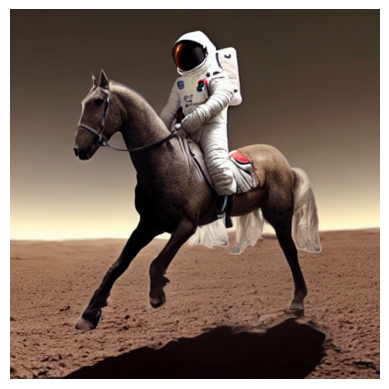

In [7]:
import matplotlib.pyplot as plt
plt.imshow(image)
plt.axis('off')
plt.show()

In [8]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid


  0%|          | 0/50 [00:00<?, ?it/s]

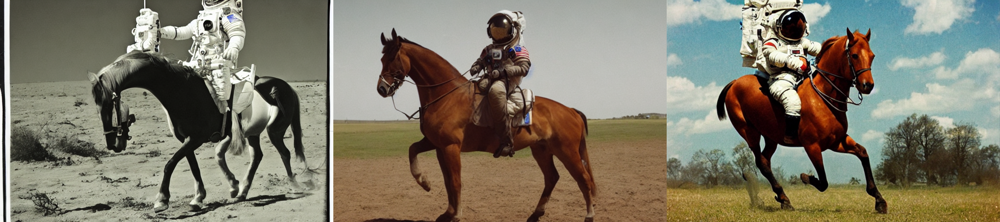

In [9]:
num_images = 3
prompt = ["a photograph of an astronaut riding a horse"] * num_images

images = pipe(prompt, height=512, width=768).images

grid = image_grid(images, rows=1, cols=3)
grid

  0%|          | 0/10 [00:00<?, ?it/s]

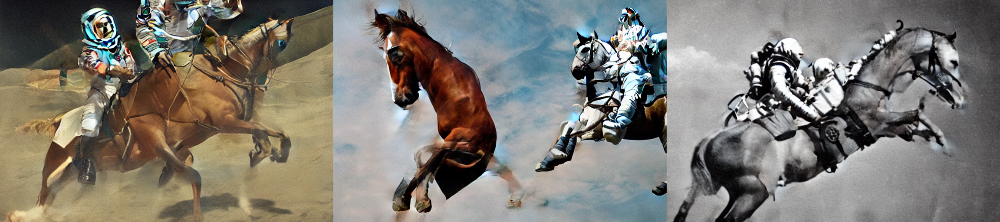

In [10]:
num_images = 3
prompt = ["a photograph of an astronaut riding a horse"] * num_images

images = pipe(prompt, height=512, width=768, num_inference_steps=10).images

grid = image_grid(images, rows=1, cols=3)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

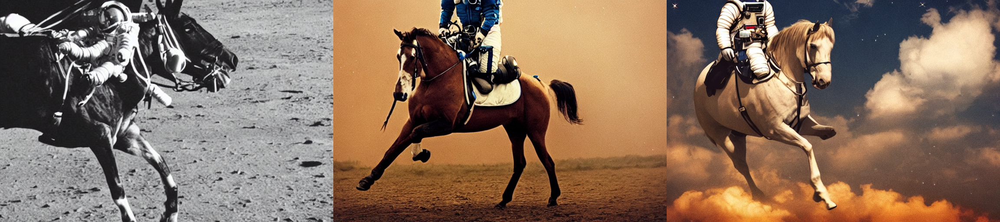

In [11]:
num_images = 3
prompt = ["a photograph of an astronaut riding a horse"] * num_images

images = pipe(prompt, height=512, width=768, num_inference_steps=50).images

grid = image_grid(images, rows=1, cols=3)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

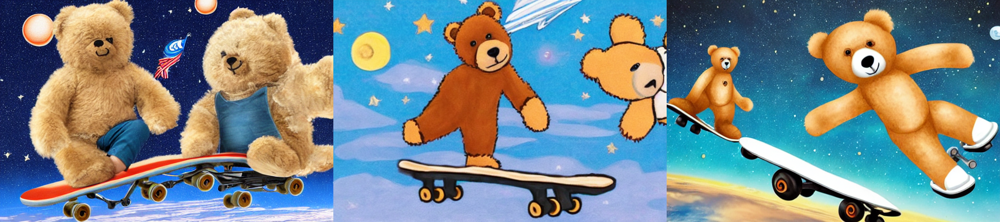

In [12]:
num_images = 3
prompt = ["A teddybear riding a skateboard in space in a super realistic style"] * num_images

images = pipe(prompt, height=512, width=768, num_inference_steps=50, guidance_scale=7.5).images

grid = image_grid(images, rows=1, cols=3)
grid

## Using Gradio

In [13]:
# Prediction Method
def predict(prompt, negative_prompt=None, steps=None, height=None, width=None):
  return pipe(prompt, height=height, width=width, negative_prompt=negative_prompt, num_inference_steps=steps, seed=1).images[0]

Prompt for example:

*   **Prompt**: a black modified custom steampunk 1970 dodge challenger big blower engine Tokyo drift photography 8k octane render intricate details cityscape, gold, blue lighting

*   **Negative**: watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face


Another example:


*   **Prompt**: sunset in a wood covered valley, centered, symmetry, painted, intricate, volumetric lighting, beautiful, rich deep colors masterpiece, sharp focus, ultra detailed, in the style of dan mumford and marc simonetti, astrophotography

*   **Negative**: underexposed, overexposed, bad art, beginner, amateur, distorted face










temple in ruines, forest, stairs, columns, cinematic, detailed, atmospheric, epic, concept art, Matte painting, background, mist, photo-realistic, concept art, volumetric light, cinematic epic + rule of thirds octane render, 8k, corona render, movie concept art, octane render, cinematic, trending on artstation, movie concept art, cinematic composition , ultra-detailed, realistic , hyper-realistic , volumetric lighting, 8k –ar 2:3 –test –uplight


In [ ]:
import gradio as gr
gr.Interface(
    predict,
    title='Stable Diffusion',
    inputs=[gr.Textbox(label='prompt'), gr.Textbox(label='negative prompt'),
            gr.Number(label='steps'), gr.Number(label='height'), gr.Number(label='width')],
    outputs = [gr.Image()]
).launch(debug=True)

Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://db6bdf72fd17556075.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


  0%|          | 0/50 [00:00<?, ?it/s]